# COGS 118A- Project Checkpoint

# Names

- David Soberanis
- Ernest Lin
- Felipe Lorenzi
- Shushruth Kallutla
- John (Morgan) Harrison

# Abstract 

We intend to use songs' audio features to classify them into genres. Our features, provided by the Spotify API, include both low-level features (such as tempo, key, loudness), which are measured through signal processing methods on the audio tracks, and high-level features (such as danceability, valence, liveness), which are derived by Spotify from the low-level features using undisclosed methods. The genres of the songs are not provided by the Spotify API; rather, we will be using a dataset from Kaggle which contains the genres of many songs. In order to measure performance, we will be using Penn Machine Learning Benchmarks (PMLB), a collection of 42 well-tested datasets that can be used for benchmarking ML models, as well as confusion matrices and an F-1 score.

# Background

Musical genres are often umbrella terms which group songs with very distinct styles. However, some features, such as the rhythm, construction of the drum beat, instrumentation, presence of vocals, and others, can be useful for correctly classifying the genre of a song <a name="biss"></a>[<sup>[1]</sup>](#bissnote). According to some, the classification of genres is often socially-driven, rather than based on the features of the songs themselves, placing songs into genres with the intention of targeting specific groups of listeners and making profit <a name="tagg"></a>[<sup>[2]</sup>](#taggnote) <a name="greenberg"></a>[<sup>[3]</sup>](#greenbergnote).

However, relatively recent research uncovered that songs often cluster into three distinct categories: "“Arousal” (the energy level of the music); “Valence” (the spectrum from sad to happy emotions in the music); and “Depth” (the amount of sophistication and emotional depth in the music)" <a name="greenberg"></a>[<sup>[3]</sup>](#greenbergnote).

It would be interesting to understand if other musical features could be useful for classifying songs into genres. This could uncover new rule-sets for music genre recognition by analyzing which features are most associated with which genres. The features present in the Spotify API appear to be promising for this task as they include the features aforementioned of valence, arousal and depth and more. In addition, the Spotify API provides more low-level musical features which can be extracted from the audio signal of a song, and many examples can be found online of people classifying songs into genres based only on these low-level features, with some success <a name="venturott"></a>[<sup>[4]</sup>](#venturottnote) <a name="elbir"></a>[<sup>[5]</sup>](#elbirnote).

Models for genre recognition could be useful for providing features to music recommendation systems, such as Spotify's itself. Furthermore, it is no news that knowing the genre of a song is useful for listeners to find songs they like, however having an automatic approach which only takes into account the actual musical features of a song could make the process faster and more fruitful to users.

# Problem Statement

Our project aims to use supervised machine learning techniques to classify songs on Spotify into distinct Generes. By doing so, we hope to explore the underlying features that characterize each genere and the criterias that differentiate various generes.

# Data

 - Here is the data set we are using: https://www.kaggle.com/datasets/grasslover/spotify-music-genre-list?resource=download&select=songDb.tsv
- It is a Spotify music genre list with 131,580 rows and 20 columns. 
- Each row contains a song. The columns contain song features from Spotify's API including: Danceability, Energy, Key, Loudness, Mode, Speedchness, Acousticness, Instrumentalness, Liveness, Valence, Tempo, Time Signature, and Duration. The rest of the columns contain information regarding the location of the song in Spotify. 
- The critical variables are the aforementioned song features. These 13 features will be converted into the design matrix and will be used to predict a song's genre. 
- The following is some EDA and data wrangling.

In [4]:
# Imports 
# import pandas & numpy library
import pandas as pd
import numpy as np

# imoprt seaborn & matplotlib
import seaborn as sns
import matplotlib.pyplot as plt

# import KNN from sklearn
from sklearn.neighbors import KDTree

# shows a bigger plot size for readability 
plt.rcParams['figure.figsize'] = (12, 5)
#improve resolution
%config InlineBackend.figure_format ='retina'

# read 'songDb.tsv' into dataframe with correct encoding  
music = pd.read_csv('songDb.tsv', sep='\t', encoding='ISO-8859-1')

C:\Users\David Soberanis\AppData\Local\Temp\ipykernel_20776\2281260961.py:19: DtypeWarning: Columns (11,18) have mixed types. Specify dtype option on import or set low_memory=False.
  music = pd.read_csv('songDb.tsv', sep='\t', encoding='ISO-8859-1')


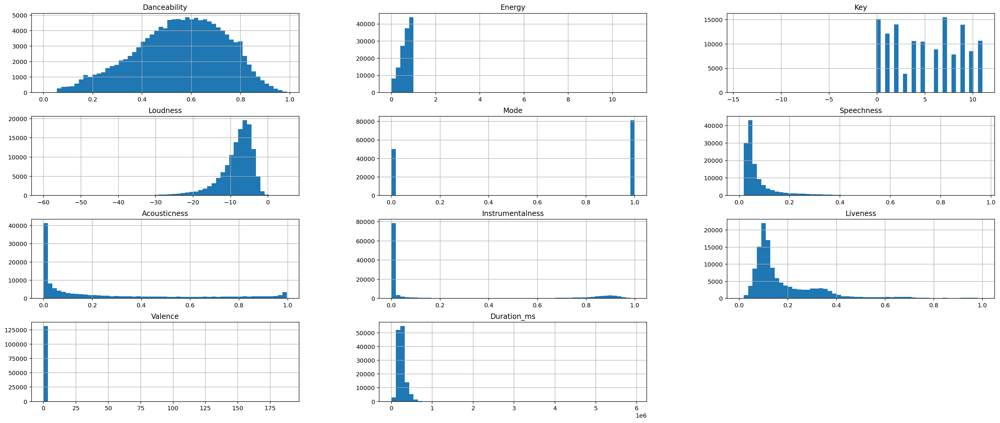

In [2]:
# Initial EDA 
# shows various distributions of features
plt.rcParams['figure.figsize'] = (29, 12) # increase size 
hist = music.hist(bins=55)

- In the kaggle dataset there were over 2800 unique genres to start. The issue is many of these genres were too specific for example: 'Minecraft music'. We decided it would be best to group these genres into more general categories to start. 
- Grouping genres required researching a song's genre name and then determening if it could fit in a more general category. If it could, we would replace the song's genre name with a general genre name. A couple examples are below.
  - Sometimes this was easy: a genre containing the string 'electro' can be replaced with the 'Electronic' genre name. 
  - Other times it was harder: replacing the string 'lo-fi' with 'Alternative' would require some googling. 
- Below is how we grouped genres for the 'genre_dataset.txt' dataset.

In [2]:
# Grouping Genres 

base = "genre_dataset.txt"
with open(base) as b:
    lines = b.read().splitlines()
split = np.array(lines)
split[:10]
df = pd.DataFrame(split, columns = ['genres'])
df.loc[df['genres'].str.contains('rock')] = 'Rock'
df.loc[df['genres'].str.contains('hip hop')] = 'Rap'
df.loc[df['genres'].str.contains('country')] = 'Country'
df.loc[df['genres'].str.contains('rap')] = 'Rap'
df.loc[df['genres'].str.contains('r&b')] = 'R&B'
df.loc[df['genres'].str.contains('folk')] = 'Folk'
df.loc[df['genres'].str.contains('acoustic')] = 'Acoustic'
df.loc[df['genres'].str.contains('core')] = 'Punk'
df.loc[df['genres'].str.contains('jazz')] = 'Jazz'
df.loc[df['genres'].str.contains('metal')] = 'Metal'
df.loc[df['genres'].str.contains('edm')] = 'Electronic'
df.loc[df['genres'].str.contains('electronic')] = 'Electronic'
df.loc[df['genres'].str.contains('house')] = 'Electronic'
df.loc[df['genres'].str.contains('industrial')] = 'Electronic'
df.loc[df['genres'].str.contains('glitch')] = 'Electronic'
df.loc[df['genres'].str.contains('idm')] = 'Electronic'
df.loc[df['genres'].str.contains('techno')] = 'Electronic'
df.loc[df['genres'].str.contains('garage')] = 'Electronic'
df.loc[df['genres'].str.contains('reggeaton')] = 'Electronic'
df.loc[df['genres'].str.contains('soul')] = 'Soul'
df.loc[df['genres'].str.contains('pop')] = 'Pop'
df.loc[df['genres'].str.contains('funk')] = 'Funk'
df.loc[df['genres'].str.contains('reggae')] = 'reggae'
df.loc[df['genres'].str.contains('punk')] = 'Punk'
df.loc[df['genres'].str.contains('classical')] = 'Classical'
df.loc[df['genres'].str.contains('indie')] = 'Indie'
df.loc[df['genres'].str.contains('ambient')] = 'Ambient'
df.loc[df['genres'].str.contains('grunge')] = 'Punk'
df.loc[df['genres'].str.contains('gospel')] = 'Gospel'
df.loc[df['genres'].str.contains('latin')] = 'Latin'
df.loc[df['genres'].str.contains('grime')] = 'Rap'
df.loc[df['genres'].str.contains('trap')] = 'Rap'
df.loc[df['genres'].str.contains('americana')] = 'Folk'
df.loc[df['genres'].str.contains('bluegrass')] = 'Blues'
df.loc[df['genres'].str.contains('blues')] = 'Blues'
df.loc[df['genres'].str.contains('roots')] = 'Blues'
df.loc[df['genres'].str.contains('dance')] = 'Dance'
df.loc[df['genres'].str.contains('children')] = 'Children'
df.loc[df['genres'].str.contains('synth')] = 'Electronic'
df.loc[df['genres'].str.contains('future')] = 'Dance'
df.loc[df['genres'].str.contains('piano')] = 'Classical'
df.loc[df['genres'].str.contains('funk')] = 'Funk'
df.loc[df['genres'].str.contains('prog')] = 'Rock'
df.loc[df['genres'].str.contains('death')] = 'Metal'
df.loc[df['genres'].str.contains('gaze')] = 'Rock'
df.loc[df['genres'].str.contains('sing')] = 'Vocals'
df.loc[df['genres'].str.contains('dubstep')] = 'Electronic'
df.loc[df['genres'].str.contains('psych')] = 'Rock'
df.loc[df['genres'].str.contains('medieval')] = 'Folk'
df.loc[df['genres'].str.contains('step')] = 'dance'
df.loc[df['genres'].str.contains('choir')] = 'Vocals'
df.loc[df['genres'].str.contains('emo')] = 'Punk'
df.loc[df['genres'].str.contains('drone')] = 'Ambient'
df.loc[df['genres'].str.contains('grind')] = 'Punk'
df.loc[df['genres'].str.contains('cappella')] = 'Vocals'
df.loc[df['genres'].str.contains('orchestra')] = 'Classical'
df.loc[df['genres'].str.contains('trance')] = 'Electronic'
df.loc[df['genres'].str.contains('thrash')] = 'Metal'
df.loc[df['genres'].str.contains('alternative')] = 'Alternative'
df.loc[df['genres'].str.contains('worship')] = 'Gospel'
df.loc[df['genres'].str.contains('dubstep')] = 'Electronic'
df.loc[df['genres'].str.contains('choir')] = 'Vocals'
df.loc[df['genres'].str.contains('pipes')] = 'Classical'
df.loc[df['genres'].str.contains('idol')] = 'pop'
df.loc[df['genres'].str.contains('soundtrack')] = 'Film'
df.loc[df['genres'].str.contains('film')] = 'Film'
df.loc[df['genres'].str.contains('wave')] = 'Electronic'
df.loc[df['genres'].str.contains('poetry')] = 'Spoken Word'
df.loc[df['genres'].str.contains('spoken')] = 'Spoken Word'
df.loc[df['genres'].str.contains('electro')] = 'Electronic'
df.loc[df['genres'].str.contains('lo-fi')] = 'Alternative'
df.loc[df['genres'].str.contains('ska')] = 'Ska'

dropped = df.drop_duplicates()
df['genres'].value_counts() # shows the top 5 genres by song count

Rock             281
Indie            265
Pop              241
Electronic       181
Rap              179
                ... 
tin pan alley      1
operetta           1
brass band         1
barnemusikk        1
mashup             1
Name: genres, Length: 849, dtype: int64

# Cleaning and Filtering rows for top 5 genres
- After initial grouping we filtered the song dataframe by the top 5 genres (by number of songs in that genre). We dropped all songs that were not part of the top 5 genres. 
- gets rid of NaN values
- removes all songs that are not in the top 5 genres
- fixes indexing 
- fixes dtypes

In [5]:
df = music 

df = df.rename({'Genre':'genres'}, axis='columns') # rename to match 
df = df.dropna()

# combines subgenres into more general Genres. This function removes all genres outside of the top 5.
# You can alter this to include more than the top 5 genres
def CombineGenre(str_in):

    try:
        str_in = str_in.lower()
        str_in = str_in.strip()
        
        if 'rock' in str_in or 'prog' in str_in or 'gaze' in str_in or 'psych' in str_in:
            output = 'Rock'
        elif 'hip hop' in str_in or 'rap' in str_in or 'grime' in str_in or 'trap' in str_in:
            output = 'Rap'
        elif 'pop' in str_in:
            output = 'Pop'
        elif ('edm' in str_in or 'electronic' in str_in or 'house' in str_in or 'industrial' in str_in or 'glitch' in str_in 
                or 'idm' in str_in or 'techno' in str_in or 'garage' in str_in or 'reggeaton' in str_in or 'synth' in str_in 
                or 'dubstep' in str_in or 'trance' in str_in or 'wave' in str_in or 'electro' in str_in):
            output = 'Electronic'
        elif 'indie' in str_in:
            output = 'Indie'
        else:
            output  = np.nan
    except:
        output = np.nan
        
    return output

# applys above function to combine genres
df['genres'] = df['genres'].apply(CombineGenre)
df = df.dropna() # removes all genres that were not combined before 
df = df.reset_index() # resets the index since we removed many rows
# df # shows now filtered df of music
# df['genres'].value_counts() # shows number of songs in each top 5 genres

# Create Design Matrix and Target vectors

In [6]:
feature_cols = ['Danceability', 'Energy', 'Key', 'Loudness', 'Mode',
                'Speechness', 'Acousticness', 'Instrumentalness', 'Liveness', 'Valence',
                'Tempo', 'Duration_ms', 'time_signature']
target_col = 'genres'

X = df[feature_cols]
y = df[target_col]

print(f'Feature cols: {feature_cols}')
print(f'Target: {target_col}')

# Create train and test sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.7, random_state=42)

print(f'Training shape: {X_train.shape}')
print(f'Testing shape: {X_test.shape}')

Feature cols: ['Danceability', 'Energy', 'Key', 'Loudness', 'Mode', 'Speechness', 'Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo', 'Duration_ms', 'time_signature']
Target: genres
Training shape: (15588, 13)
Testing shape: (36374, 13)


# EDA on Design Matrix

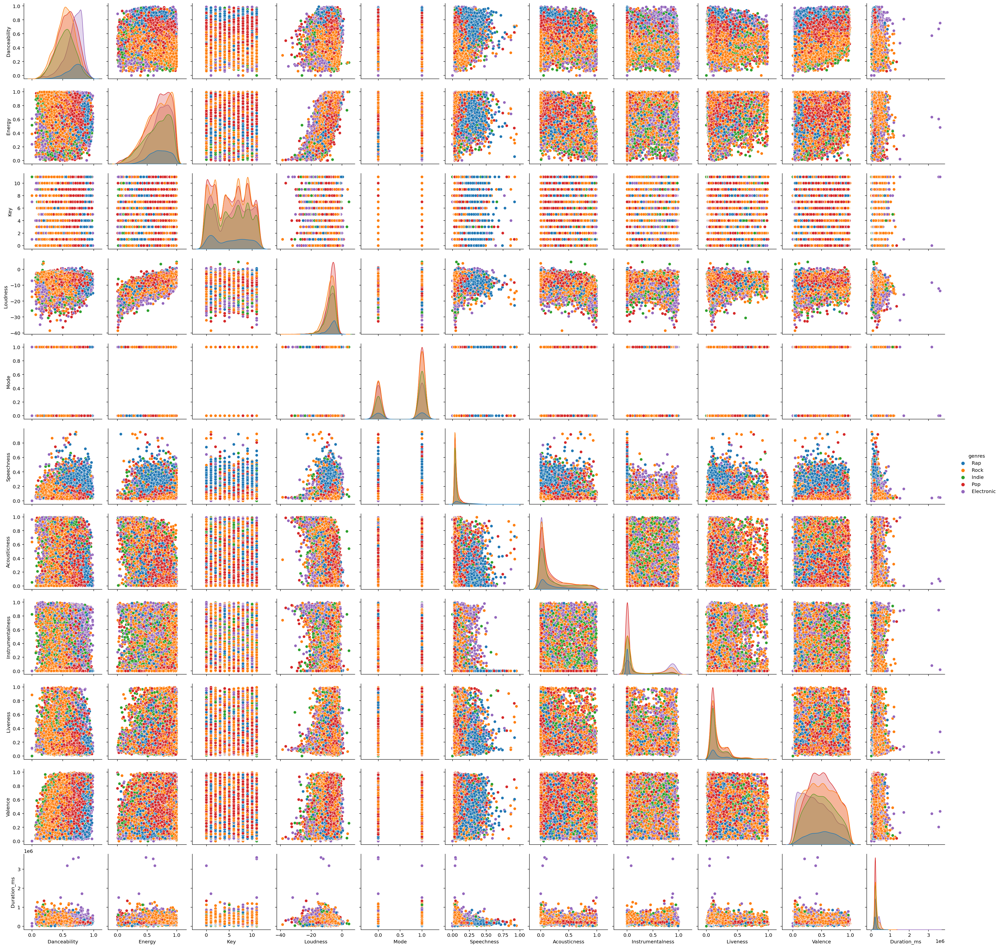

CPU times: total: 5min 14s
Wall time: 5min 14s


In [9]:
%%time
sns.pairplot(df[feature_cols + [target_col]], hue = 'genres')
plt.show()

Danceability and Valence seems to have different distributions per genre

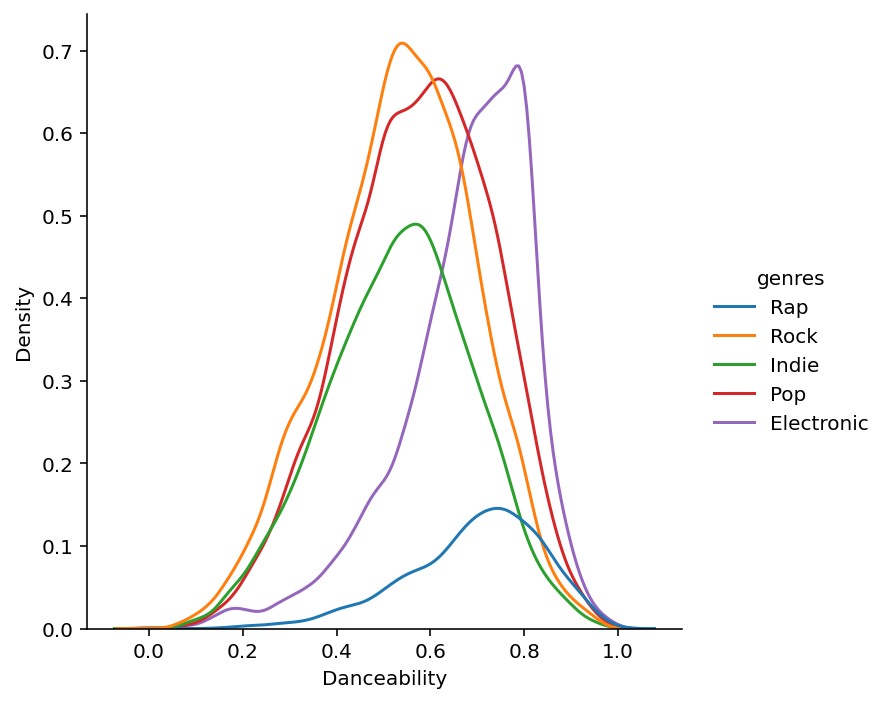

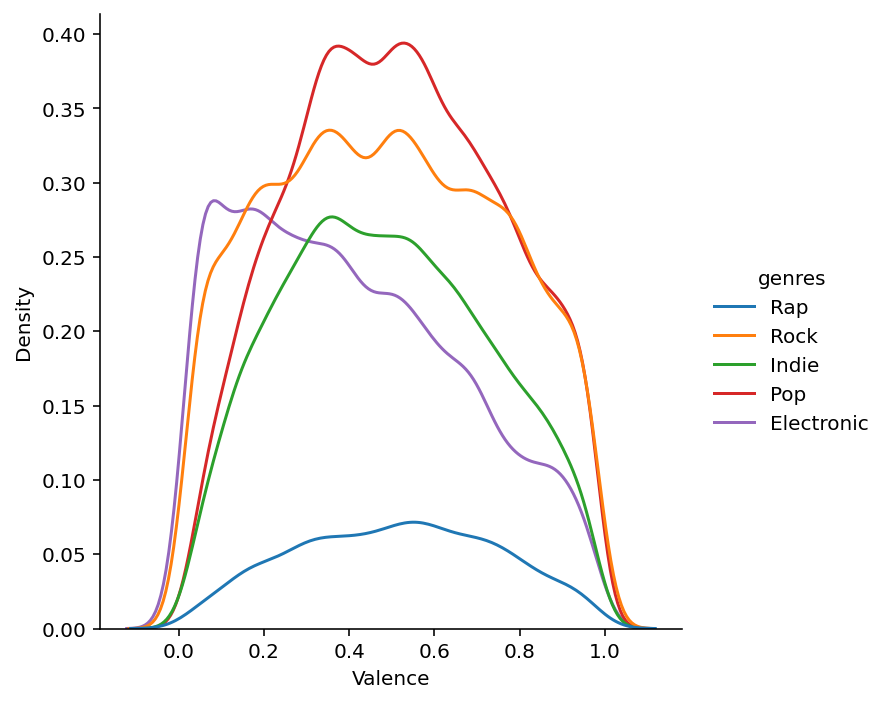

In [10]:
sns.displot(df, x = 'Danceability', hue = 'genres', kind = 'kde')
sns.displot(df, x = 'Valence', hue = 'genres', kind = 'kde')

# Proposed Solution

We will be utilizing supervised learning with k-nearest neighbors. We will use the genres given in the Kaggle dataset as labels for each song and use song features (valence, danceability, etc) as inputs to classify the genre of new songs. 

Since we assume that song features of a genre are similar, we determined that using k-nearest neighbors is a suitable solution to this problem. The features of a song (valence, danceability, etc) will be used to calculate the distance of a song to other labeled songs within a specific proximity to determine what genre a song most resembles out of all the labeled data that were given. 

We will also use linear regression as a benchmark model to compare to our solution.

# Evaluation Metrics

- In preliminary results we use Nested Cross validation to test different parameters for logistic regression.
- We will use Penn Machine Learning Benchmarks (PMLB) Which is a collection of 42 well-tested datasets that can be used for benchmarking both classification and regression supervised machine learning models<a name="PMLB"></a>[<sup>[12]</sup>](#PMLB). 
- For classification accuracy, we will use a confusion matrix. A confusion matrix is used to evaluate the accuracy of a multiclass classifier model<a name="confusion matrix"></a>[<sup>[10]</sup>](#confusionmatrix). Since we will be classifying songs by genres a confusion matrix will help us benchmark our classifier model. The way the confusion matrix works is one has predicted classes on the columns and actual classes on the rows. These predicted and actual classes are matched up for comparison. For example cell (1x1) could represent a true positive for the genre 'Rock' if the first row is an actual classification for 'Rock' and the first row is the predicted classification for 'Rock.' There are True Positives, True Negatives, False Positives, and False Negatives. Our data will include the genre of the songs which we will use for our (actual) classification in the matrix. After the confusion matrix is created we will calculate the accuracy of our model with the following:

\begin{align}
        Accuracy = \frac{TruePositive + TrueNegative \ }{TotalSample}
    \end{align}
- We can also test the sensitivity of our model with the following:

\begin{align}
        True Positive Rate (Sensitivity) = \frac{TruePositive \ }{False Negative + True Positive}
    \end{align}

- When we are deciding which classifier to use we can use an F1-Score for comparison. This test combines the precision and recall of a classifier into a single metric by using their harmonic mean. This will allow us to compare if classifier A has better recall or precision when compared to B then we can further test to see if precision is more important than recall or vice versa. 
- F1 score formula <a name="f1score"></a>[<sup>[11]</sup>](#f1score)

\begin{align}
        F1 = \frac{2 \ }{ \frac{1}{Recall} + \frac{1}{Precision}}
    \end{align}

- Precision: Number of correct positives divided by the number of total positive results predicted by the classifier

\begin{align}
        Precision = \frac{TruePositive \ }{True Positive + False Positive }
    \end{align}
    
- Recall: Number of correct positives divided by the number of all samples that should have been identified as positive 

\begin{align}
        Precision (Recall) = \frac{TruePositive \ }{True Positive + False Negative }
    \end{align}

# Preliminary results

- We found very similar results across kNN and Logistic Regression the scores varied from 0.3-0.33 accuracy. While still better than random chance 0.20, this could use some improvement. 
- We will try increasing the number of genres to remove overlap. And removing non english songs to remove the potential variance that comes with that
- Additionally we will continue to try more models and grid searching hyperparameters. 

For our preliminary results, we will be working with a **sample of 10% of our data** in order to avoid long training times and facilitate testing multiple models. The sample is **weighted** according to the proportion of labels in the full dataset in order to maintain the same balance.

In [7]:
full_data = df[feature_cols + [target_col]]
df_small = full_data.groupby('genres').apply(lambda x: x.sample(frac = 0.1, random_state = 0)).reset_index(
    drop = True)

In [8]:
proportions_full = full_data['genres'].value_counts(normalize = True).round(3).to_dict()
proportions_small = df_small['genres'].value_counts(normalize = True).round(3).to_dict()

print(f'Full data shape: {full_data.shape}')
print('Full data target proportions:')
print(proportions_full)
print()
print(f'Sample data shape: {df_small.shape}')
print('Sample data target proportions:')
print(proportions_small)

Full data shape: (51962, 14)
Full data target proportions:
{'Pop': 0.28, 'Rock': 0.276, 'Electronic': 0.202, 'Indie': 0.193, 'Rap': 0.049}

Sample data shape: (5196, 14)
Sample data target proportions:
{'Pop': 0.28, 'Rock': 0.276, 'Electronic': 0.202, 'Indie': 0.193, 'Rap': 0.049}


In [ ]:
# This is a small set for testing 

X_small = df_small[feature_cols]
y_small = df_small[target_col]

Average difference of 0.000000 with std. dev. of 0.000000.


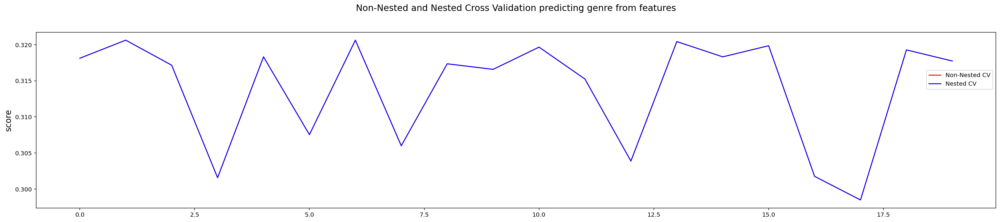

CPU times: total: 9.7 s
Wall time: 16.3 s


In [29]:
# we use the small sets X_small and y_small in this cell 

from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression


# Number of random trials
NUM_TRIALS = 20

# Set up possible values of parameters to optimize over
# this is a regularization parameter, smaller C => more regularization
p_grid = {"C": [1, 10, 100,  1000]}

# We will use a Logistic Regression
logreg =  LogisticRegression(max_iter=5000, random_state=42)

# Arrays to store scores
non_nested_scores = np.zeros(NUM_TRIALS)
nested_scores = np.zeros(NUM_TRIALS)

# Loop for each trial
for i in range(NUM_TRIALS):

    # Choose cross-validation techniques for the inner and outer loops,
    # independently of the dataset.
    # E.g "GroupKFold", "LeaveOneOut", "LeaveOneGroupOut", etc.
    inner_cv = KFold(n_splits=3, shuffle=True, random_state=i)
    outer_cv = KFold(n_splits=3, shuffle=True, random_state=i)

    # Non_nested parameter search and scoring
    clf = GridSearchCV(estimator=logreg, param_grid=p_grid, cv=inner_cv, n_jobs=-1)
    clf.fit(X_small, y_small)
    non_nested_scores[i] = clf.best_score_

    # Nested CV with parameter optimization
    nested_score = cross_val_score(clf, X=X_small, y=y_small, cv=outer_cv)
    nested_scores[i] = nested_score.mean()

score_difference = non_nested_scores - nested_scores

print("Average difference of {:6f} with std. dev. of {:6f}."
      .format(score_difference.mean(), score_difference.std()))

# Plot scores on each trial for nested and non-nested CV
plt.figure()
plt.subplot(211)
non_nested_scores_line, = plt.plot(non_nested_scores, color='r')
nested_line, = plt.plot(nested_scores, color='b')
plt.ylabel("score", fontsize="14")
plt.legend([non_nested_scores_line, nested_line],
           ["Non-Nested CV", "Nested CV"],
           bbox_to_anchor=(1, 0, 0, .8)) #(0, .4, .5, 0))
plt.title("Non-Nested and Nested Cross Validation predicting genre from features",
          x=.5, y=1.1, fontsize="15")

plt.show()


Average difference of 0.000000 with std. dev. of 0.000000.


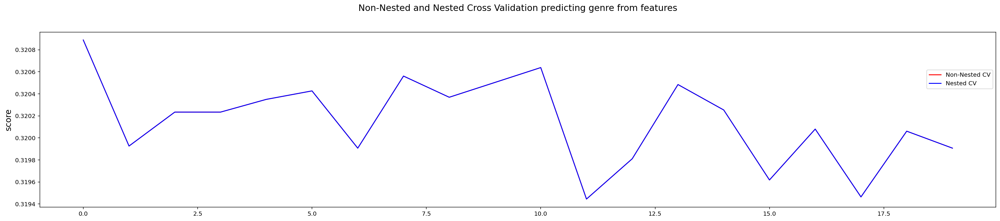

In [32]:
# here we attempt the same as above but with the entire dataset

# Number of random trials
NUM_TRIALS = 20

# Set up possible values of parameters to optimize over
# this is a regularization parameter, smaller C => more regularization
p_grid = {"C": [1, 10, 100,  1000]}

# We will use a Logistic Regression
logreg =  LogisticRegression(max_iter=5000, random_state=42)

# Arrays to store scores
non_nested_scores = np.zeros(NUM_TRIALS)
nested_scores = np.zeros(NUM_TRIALS)

# Loop for each trial
for i in range(NUM_TRIALS):

    # Choose cross-validation techniques for the inner and outer loops,
    # independently of the dataset.
    # E.g "GroupKFold", "LeaveOneOut", "LeaveOneGroupOut", etc.
    inner_cv = KFold(n_splits=3, shuffle=True, random_state=i)
    outer_cv = KFold(n_splits=3, shuffle=True, random_state=i)

    # Non_nested parameter search and scoring
    clf = GridSearchCV(estimator=logreg, param_grid=p_grid, cv=inner_cv, n_jobs=-1)
    clf.fit(X, y)
    non_nested_scores[i] = clf.best_score_

    # Nested CV with parameter optimization
    nested_score = cross_val_score(clf, X=X, y=y, cv=outer_cv)
    nested_scores[i] = nested_score.mean()

score_difference = non_nested_scores - nested_scores

print("Average difference of {:6f} with std. dev. of {:6f}."
      .format(score_difference.mean(), score_difference.std()))

# Plot scores on each trial for nested and non-nested CV
plt.figure()
plt.subplot(211)
non_nested_scores_line, = plt.plot(non_nested_scores, color='r')
nested_line, = plt.plot(nested_scores, color='b')
plt.ylabel("score", fontsize="14")
plt.legend([non_nested_scores_line, nested_line],
           ["Non-Nested CV", "Nested CV"],
           bbox_to_anchor=(1, 0, 0, .8)) #(0, .4, .5, 0))
plt.title("Non-Nested and Nested Cross Validation predicting genre from features",
          x=.5, y=1.1, fontsize="15")


plt.show()


In [31]:
# KNN 
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import NeighborhoodComponentsAnalysis, KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.compose import TransformedTargetRegressor

# Label encoder for target (fitting it now to avoid unknown classes or different labels in testing)
le = LabelEncoder().fit(df[target_col].unique())

# KNN transformer and classifier
nca = NeighborhoodComponentsAnalysis(random_state=42)
knn = KNeighborsClassifier(n_neighbors=3, n_jobs = -1)

# Pipelining
nca_pipe = Pipeline([
    ('nca', nca), 
    ('knn', knn)
])

# Fit
nca_pipe.fit(X_train, le.transform(y_train))

# Preliminary score
print('Preliminary score', nca_pipe.score(X_test, le.transform(y_test)))

0.30164403145103647


# Ethics & Privacy

In regards to data privacy, there is none to be concern about as the data we are going to use to train our models are simply song features, which are public information on Spotify provided by the Spotify API. Since these songs are available on Spotify, it means that the artists willingly published their songs to the public.

One ethical concern with the datasets we will use is the possible biases. Since we cannot sample randomly from the set of every song in existence on Spotify, we have to resort to using sample datasets with songs that are mostly well known and popular. This might introduce bias into our data as there is a possibility that popular or well known songs share similar audio features. Less popular song genres may be excluded from the model's training dataset, which could have vastly different audio features. Additionally, there are numerous songs in different languages and cultures that public datasets may not cover. Songs with different cultural backgrounds may have vastly different features, and just analyzing popular songs in America is not representative of all the songs in the world. 

As such, our machine learning model may have more difficulty in identifying the correct valence for less well-known songs. One possible solution to this issue is to use a more diverse set of songs as our dataset, but from a realistic perspective it is impossible to sample from every form of music in existence. As such, the only solution is to address that the model we create can only be applied to popular or well-known songs of today in particularly the US.

# Team Expectations 

* *Team Expectation 1*: meet once or twice a week
* *Team Expectation 2*: try to meet on wed after class and 12 on Sat
* *Team Expecation 3*: get assigned work done before next meeting
* *Team Expecation 4*: 24-48 hours to respond to questions
* *Team Expecation 5*: communicate on discord

# Project Timeline Proposal


| Meeting Date  | Meeting Time| Completed Before Meeting  | Discuss at Meeting |
|---|---|---|---|
| 4/24  | 10 AM  | Edit, finalize, and submit proposal; Search for datasets  | Discuss Wrangling and possible analytical approaches; Assign group members to lead each specific part   |
| 5/12  | 6 PM  | Import & Wrangle Data ,do some EDA | Review/Edit wrangling/EDA; Discuss Analysis Plan   |
| 5/20  | 12 PM  | Finalize wrangling/EDA; Begin programming for project | Discuss/edit project code; Complete project |
| 5/25  | 12 PM  | Complete analysis; Draft results/conclusion/discussion | Discuss/edit full project |
| 6/8  | Before 11:59 PM  | NA | Turn in Final Project  |

# Footnotes
<a name="bissnote"></a>1.[^](#biss): Biss, Madars. (2021) Rhythm Tips for Identifying Music Genres by Ear. *Musical U*. https://www.musical-u.com/learn/rhythm-tips-for-identifying-music-genres-by-ear/<br> 
<a name="taggnote"></a>2.[^](#tagg): Fabbri, Franco. (1980) A Theory of Musical Genres:
Two Applications. *Popular Music Perspectives*. https://www.tagg.org/xpdfs/ffabbri81a.pdf<br> 
<a name="greenbergnote"></a>3.[^](#greenberg): Greenberg, David M. (6, August 2016) Musical genres are out of date – but this new system explains why you might like both jazz and hip hop. *EconoTimes*. http://www.econotimes.com/Musical-genres-are-out-of-date-%E2%80%93-but-this-new-system-explains-why-you-might-like-both-jazz-and-hip-hop-244941<br> 
<a name="venturottnote"></a>4.[^](#venturott): Venturott, Pedro H G. (31, January 2021) Predicting Music Genres Using Waveform Features. *Towards Data Science*. https://towardsdatascience.com/predicting-music-genres-using-waveform-features-5080e788eb64<br> 
<a name="elbirnote"></a>5.[^](#elbir): Elbir, Ahmet et. al. (2018) Music Genre Classification and Recommendation by Using Machine Learning Techniques. *IEEE*. https://ieeexplore.ieee.org/document/8554016<br> 
<a name="spotify"></a>6.[^](#spotnote): Spotify Web API. Spotify for Developers. (n.d.). Retrieved April 24, 2022, from https://developer.spotify.com/documentation/web-api/ <br>
<a name="spotify2"></a>7.[^](#spot2note): Web API reference: Get Audio Features. Get Track's Audio Features. (n.d.). Retrieved April 24, 2022, from https://developer.spotify.com/documentation/web-api/reference/#/operations/get-several-audio-features  <br>
<a name="spotify3"></a>8.[^](#spot3note): Web API reference: Get Audio Analysis. Get Track's Audio Analysis. (n.d.). Retrieved April 24, 2022, from https://developer.spotify.com/documentation/web-api/reference/#/operations/get-audio-analysis  <br>
<a name="spotipy"></a>9.[^](#spotipnote): Paul Lamere, Spotipy, (2020), A light weight Python library for the Spotify Web API, https://github.com/plamere/spotipy
<a name="confusion matrix"></a>10.[^](#confusionmatrix): Bharathi, Analytics Vidhya, (2021), Confusion Matrix for Multi-Class Classification, https://www.analyticsvidhya.com/blog/2021/06/confusion-matrix-for-multi-class-classification/#h2_4  <br>
<a name="f1score"></a>11.[^](#f1score): Aditya Mishra, Towards Data Science, (2018), Metrics to Evaluate your Machine Learning Algorithm, https://towardsdatascience.com/metrics-to-evaluate-your-machine-learning-algorithm-f10ba6e38234  <br>
<a name="PMLB"></a>12.[^](#PMLB): Penn Machine Learning Benchmarks (good data for testing our regression or classification models), https://epistasislab.github.io/pmlb/index.html  <br>